### Laboratorium 6 - część badawcza

W pakiecie OpenCV wszystkie zadania związane z detekcją i opisem punktów kluczowych realizowane są przez zestaw specjalnych klas, dla których bazową jest `cv::Feature2D`. Jedną z wielu pochodnych tej klasy jest interesująca nas na zajęciach `cv::SIFT`, z której dokumentacją należy się zapoznać.  
Najważniejsze, co trzeba wiedzieć:
1. do konstrukcji obiektu SIFT służy metoda [`cv2.SIFT_create`](https://docs.opencv.org/4.x/d7/d60/classcv_1_1SIFT.html#ad337517bfdc068ae0ba0924ff1661131) - to do niej przekazujemy parametry detektora (w dokumentacji występuje jako `cv::SIFT::create`);
2. obsługujemy detektor przez interfejs `cv::Feature2D`, konkretnie metody [`detect`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#aa4e9a7082ec61ebc108806704fbd7887) do detekcji punktów kluczowych oraz [`compute`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#ab3cce8d56f4fc5e1d530b5931e1e8dc0) do obliczania ich deskryptorów (opcjonalnie `detectAndCompute`).

Schemat użycia:
```python
sift_instance = cv2.SIFT_create()
# 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
keypoints = sift_instance.detect(image)
keypoints, descriptors = sift_instance.compute(image, keypoints)
```

`keypoints` jest listą obiektów specjalnego typu `cv2.KeyPoint`, która **jest modyfikowana** przez `SIFT::compute`!  
`descriptors` jest natomiast macierzą float32 o wymiarach NxK, gdzie N jest liczbą punktów kluczowych, a K jest liczbą obliczonych cech.

Warto również zapoznać się z funkcją [`cv2.drawKeypoints`](https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920) w kontekście prezentacji wyników. Zwróć uwagę na flagi sterujące rysowaniem - szczególnie użyteczna jest `cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

#### Zadanie 1

Przetestuj wpływ podstawowych parametrów detektora SIFT (`contrastThreshold` i `edgeThreshold`) na uzyskiwane punkty kluczowe (liczność, lokalizacja, rozmiar), korzystając z obrazów `cells` i `lena`. Pamiętaj że ich działanie jest odwrotne (tzn. jeden odsiewa cechy "mniejsze niż", a drugi "większe niż").

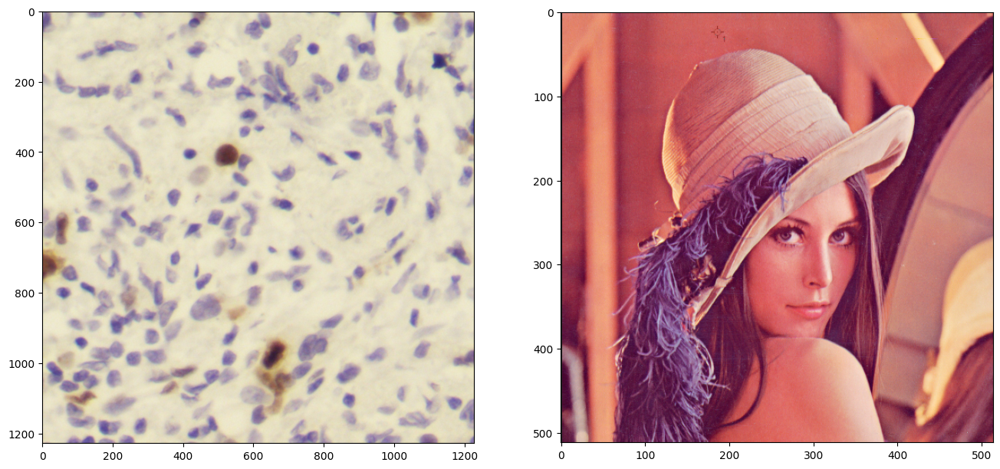

In [2]:
cells = cv2.imread('p1_0308_7.jpg')
lena = cv2.imread('Lena.jpg')
f, (a1, a2) = plt.subplots(1, 2, figsize=(16, 10))
a1.imshow(cells[..., ::-1]);
a2.imshow(lena[..., ::-1]);

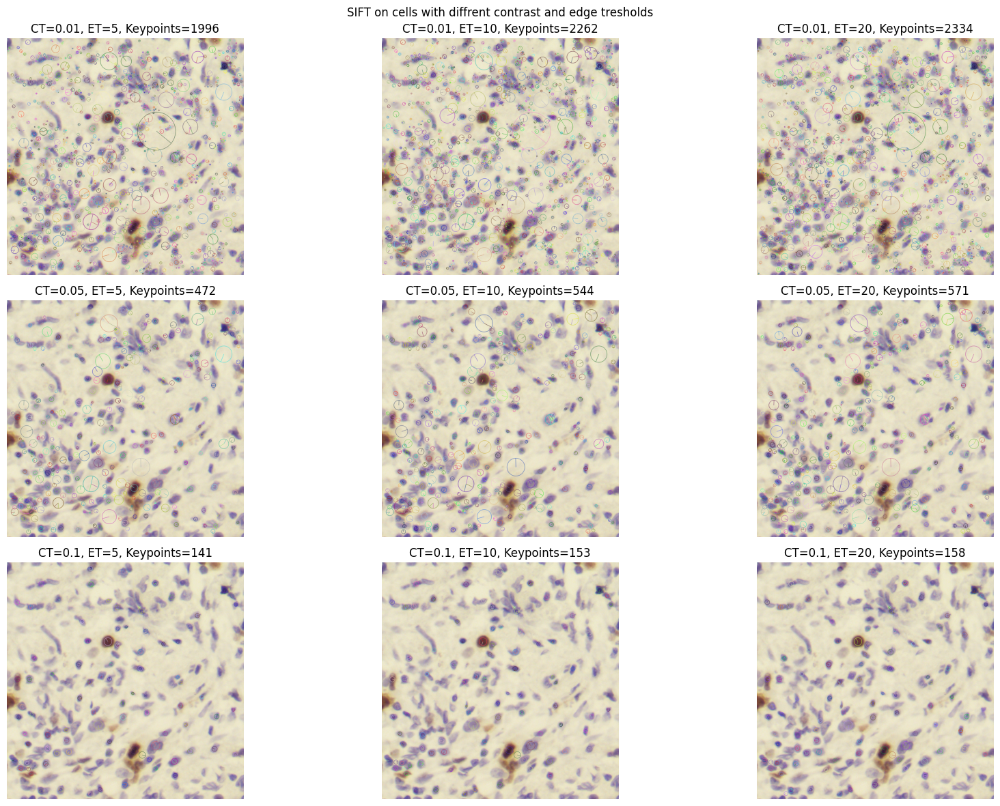

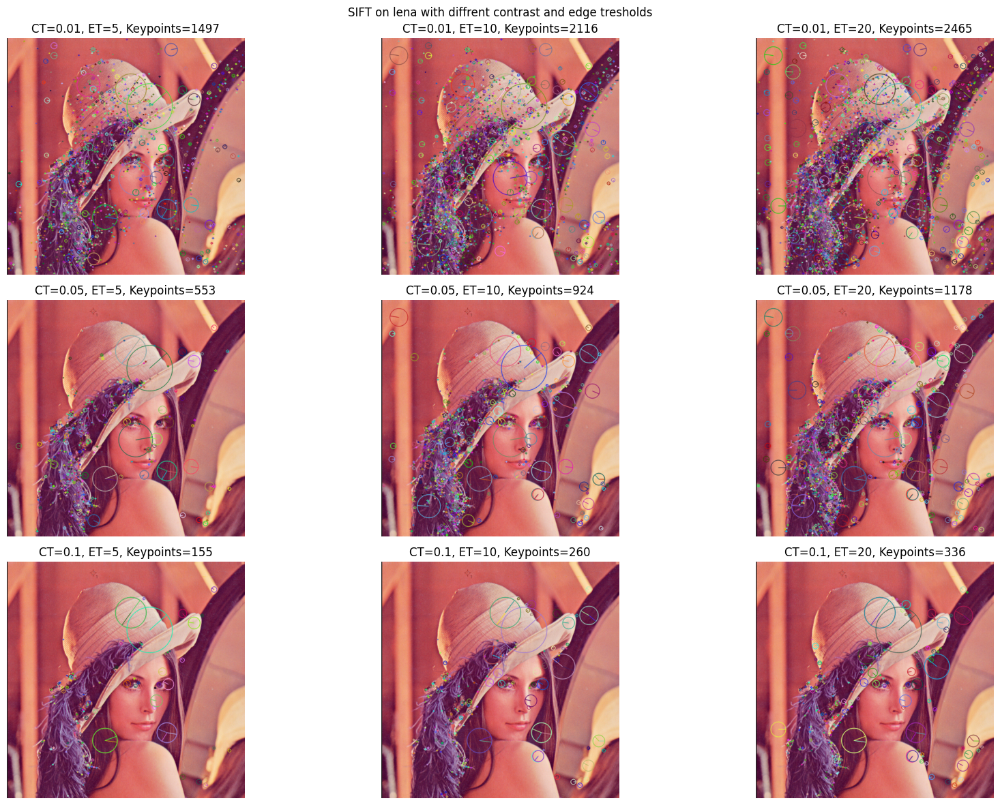

In [3]:
def test_sift_parameters(image, contrastThreshold, edgeThreshold):
    # Tworzenie instancji SIFT z podanymi parametrami
    sift = cv2.SIFT_create(contrastThreshold=contrastThreshold, edgeThreshold=edgeThreshold)
    # Detekcja punktów kluczowych
    keypoints, descriptors = sift.detectAndCompute(image, None)
    # Rysowanie punktów kluczowych na obrazie
    output_image = cv2.drawKeypoints(
        image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )
    return output_image, len(keypoints)

contrastThresholds = [0.01, 0.05, 0.1]
edgeThresholds = [5, 10, 20]


def draw_sift(img, img_name):
    plt.figure(figsize=(18, 12))
    plot_idx = 1
    for ct in contrastThresholds:
        for et in edgeThresholds:
            result_image, num_keypoints = test_sift_parameters(img, ct, et)
            plt.subplot(len(contrastThresholds), len(edgeThresholds), plot_idx)
            plt.imshow(result_image[..., ::-1], cmap='gray')
            plt.title(f"CT={ct}, ET={et}, Keypoints={num_keypoints}")
            plt.axis('off')
            plot_idx += 1
    plt.suptitle(f"SIFT on {img_name} with diffrent contrast and edge tresholds")
    plt.tight_layout()
    plt.show()
draw_sift(cells, 'cells')
draw_sift(lena, 'lena')

#### Zadanie 2

Detektor SIFT jest w teorii niezmienniczy względem translacji, rotacji czy zmiany skali. Przetestuj te własności w praktyce, sprawdzając stabilność punktów wykrywanych na obróconej i przeskalowanej wersji obrazów `cells` i `lena`. Dokonaj oceny wizualnie, sprawdzając zachowanie detektora dla kilku wybranych rotacji i skal (**nie** grid search).

_Co świadczy o stabilności i niezmienniczości detektora?_

In [4]:
def rotate(image, angle, scale=1.0):
    center = (image.shape[0] // 2, image.shape[1] // 2)
    rmat = cv2.getRotationMatrix2D(center, angle, scale)
    return cv2.warpAffine(image, rmat, (image.shape[0], image.shape[1]), flags=cv2.INTER_CUBIC)

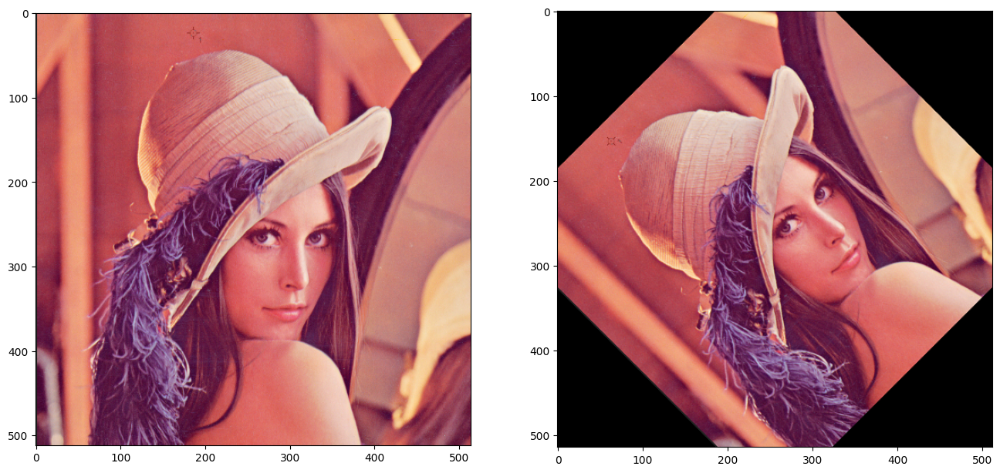

In [5]:
# przykład dla Leny, pamiętaj o cells!
lena_rot = rotate(lena, 45.0, scale=0.9)
f, (a1, a2) = plt.subplots(1, 2, figsize=(16, 10))
a1.imshow(lena[..., ::-1]);
a2.imshow(lena_rot[..., ::-1]);

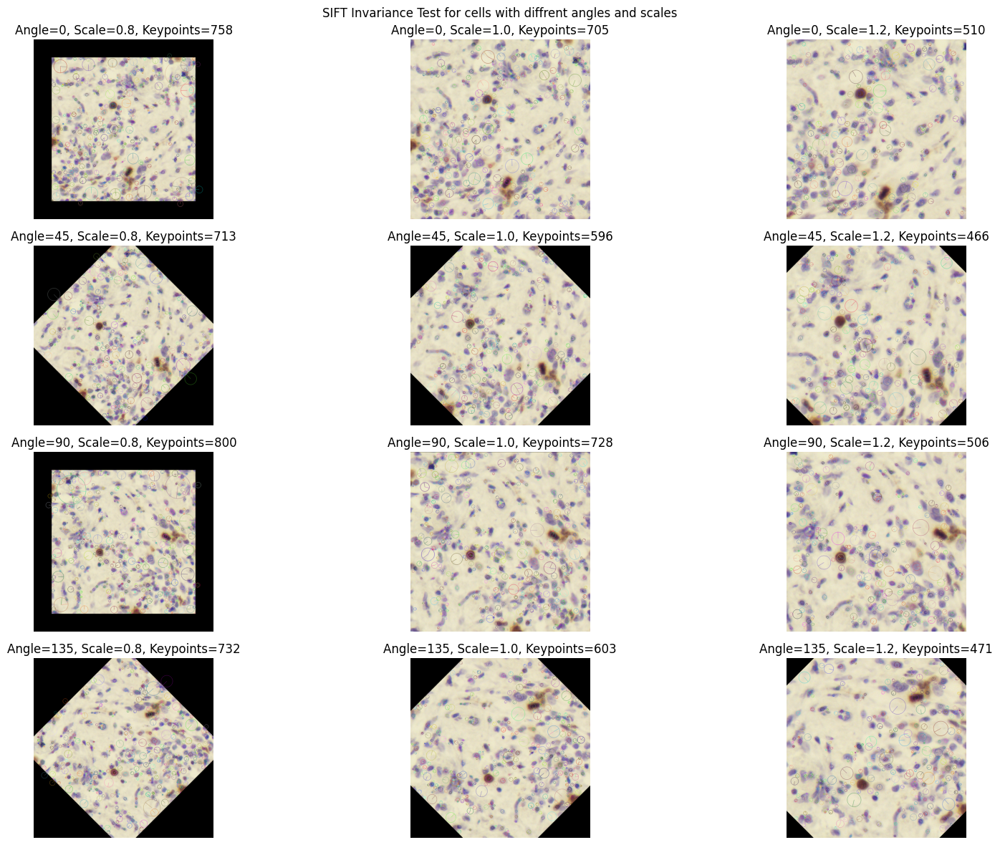

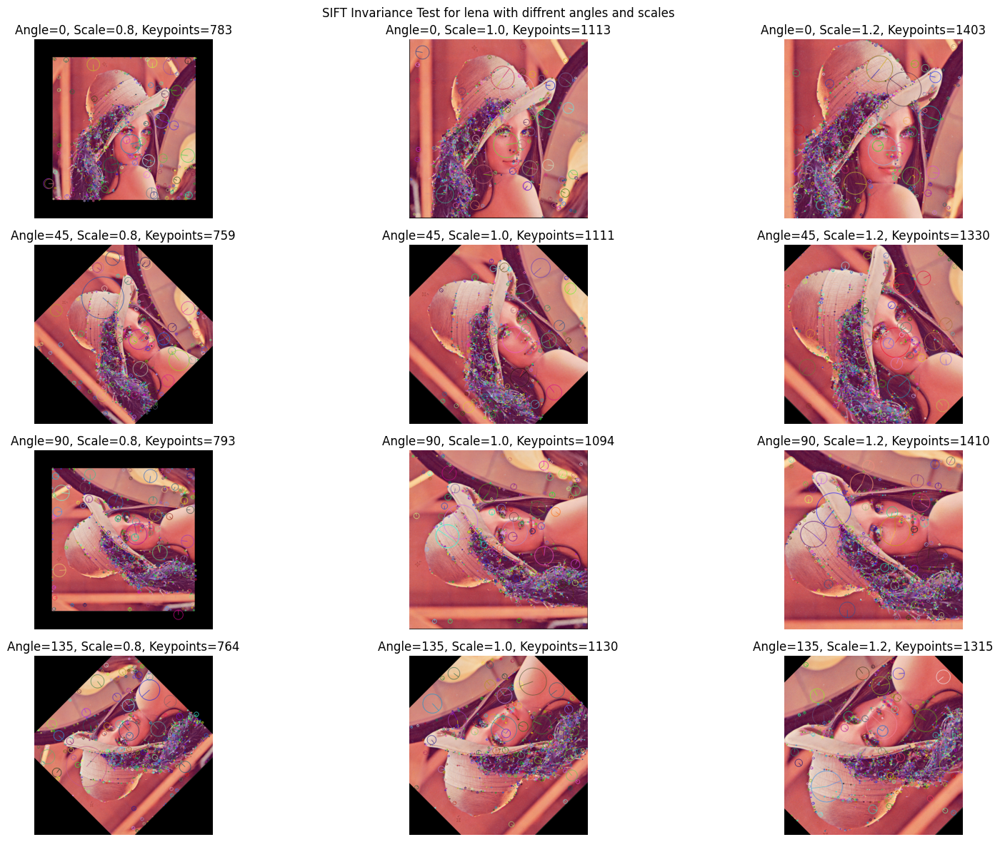

In [25]:
def test_sift_invariance(img, img_name, angles, scales):
    sift = cv2.SIFT_create()
    plt.figure(figsize=(18, 12))
    plot_idx = 1
    for angle in angles:
        for scale in scales:
            transformed_image = rotate(img, angle, scale)
            transformed_keypoints, transformed_descriptors = sift.detectAndCompute(transformed_image, None)

            output_image = cv2.drawKeypoints(
                transformed_image, transformed_keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
            )

            plt.subplot(len(angles), len(scales), plot_idx)
            plt.imshow(output_image[..., ::-1], cmap='gray')
            plt.title(f"Angle={angle}, Scale={scale}, Keypoints={len(transformed_keypoints)}")
            plt.axis('off')
            plot_idx += 1

    plt.suptitle(f"SIFT Invariance Test for {img_name} with diffrent angles and scales")
    plt.tight_layout()
    plt.show()


angles = [0, 45, 90, 135]
scales = [0.8, 1.0, 1.2]

test_sift_invariance(cells, 'cells', angles, scales)
test_sift_invariance(lena, 'lena', angles, scales)

#### Zadanie 3

Dane są obrazy `coke` i `table`. Wykorzystaj metodologię parowania punktów kluczowych do znalezienia wystąpienia puszki z Colą na stole. To zadanie jest podzielone na dwie części - czytaj dalej.

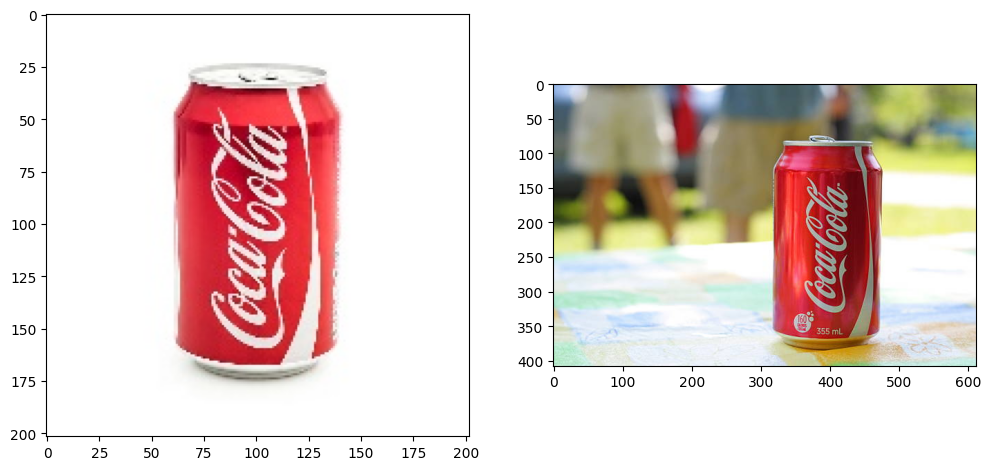

In [7]:
coke = cv2.imread('coke.jpg')
table = cv2.imread('coke-table.jpg')
f, (a1, a2) = plt.subplots(1, 2, figsize=(12,12))
a1.imshow(coke[..., ::-1]);
a2.imshow(table[..., ::-1]);

##### Zadanie 3a

Wykonaj detekcję punktów kluczowych i ich parowanie z użyciem dowolnego matchera. Wykonaj filtrację znalezionych par po dystansie - co obserwujesz, zmieniając próg?

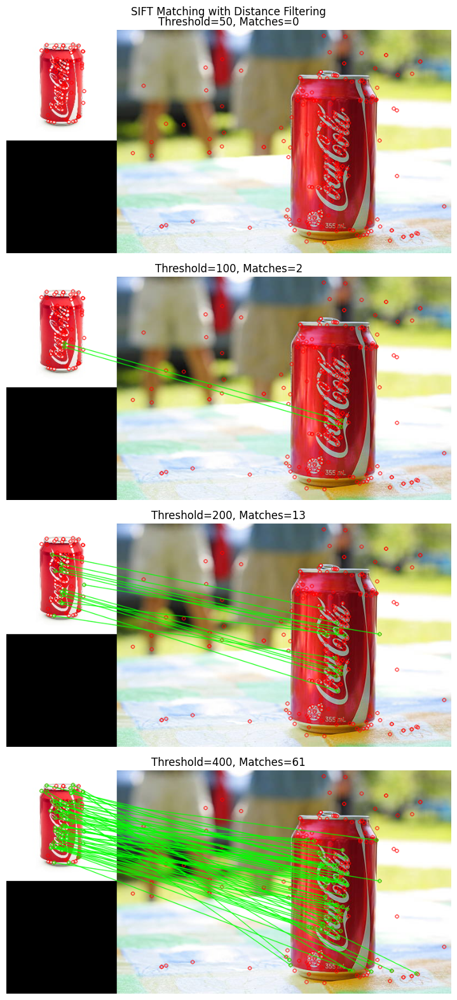

In [ ]:
distance_thresholds = [50, 100, 200, 400]

plt.figure(figsize=(12, 4 * len(distance_thresholds)))

for idx, threshold in enumerate(distance_thresholds):
    sift = cv2.SIFT_create()
    kp1, desc1 = sift.detectAndCompute(coke, None)
    kp2, desc2 = sift.detectAndCompute(table, None)
    
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(desc1, desc2)
    matches = sorted(matches, key=lambda x: x.distance)
    
    filtered_matches = [m for m in matches if m.distance < threshold]
    
    matched_image = cv2.drawMatches(
        coke, kp1, table, kp2, filtered_matches, None,
        matchColor=(0, 255, 0), singlePointColor=(0, 0, 255)
    )
    
    plt.subplot(len(distance_thresholds), 1, idx + 1)
    plt.imshow(matched_image[..., ::-1])
    plt.title(f"Threshold={threshold}, Matches={len(filtered_matches)}")
    plt.axis('off')

plt.suptitle("SIFT Matching with Distance Filtering")
plt.tight_layout()
plt.show()


##### Zadanie 3b

Znajdź transformację geometryczną dla par dopasowanych punktów, tak aby przekształcić `coke` (_train_) do geometrii `table` (_query_). Zademonstruj poprawność, zestawiając obok siebie przekształconą wersję `coke` oraz oryginalny `table`, bądź nanosząc jedno na drugie. Zidentyfikuj punkty, które znaleziona transformacja przekształca "dobrze", tzn. ich współrzędne po przekształceniu leżą w pobliżu odpowiadających im punktów z drugiego obrazu; nanieś je na obraz.

*Jak na wyniki wpływa wykrycie większej lub mniejszej liczby punktów kluczowych na etapie SIFT? W jakim stopniu filtracja poprawia rezultaty? Jak działa i jaką rolę w procesie parowania odgrywa RANSAC?*

Offset image number: 1


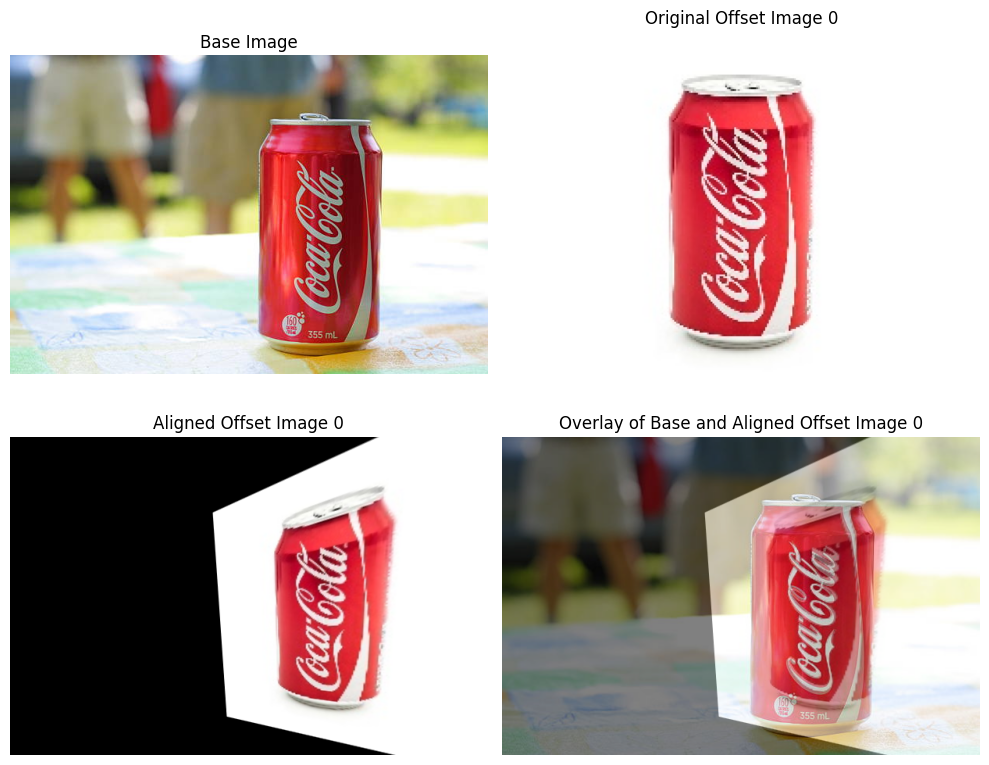

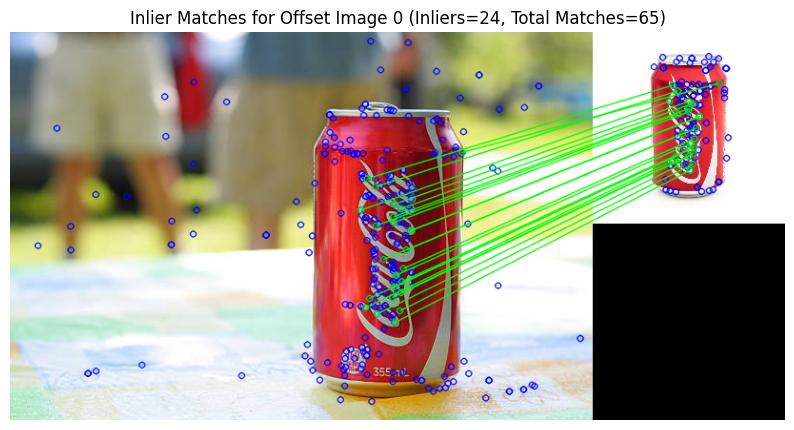

In [29]:
# Processing dla jednego obrazu
def process_offset_image(offset_img, base_img, kp_base, des_base, threshold):

    sift = cv2.SIFT_create()
    kp_offset, des_offset = sift.detectAndCompute(offset_img, None)

    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(des_base, des_offset)

    matches = sorted(matches, key=lambda x: x.distance)

    if threshold != None:
        filtered_matches = [m for m in matches if m.distance < threshold]
    else:
        filtered_matches = matches

    dst_pts = np.float32([kp_base[m.queryIdx].pt for m in filtered_matches]).reshape(-1, 1, 2)
    src_pts = np.float32([kp_offset[m.trainIdx].pt for m in filtered_matches]).reshape(-1, 1, 2)

    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    h, w, _ = base_img.shape
    aligned_img = cv2.warpPerspective(offset_img, M, (w, h))

    return aligned_img, kp_offset, filtered_matches, mask


def visualize_results(base, offset_img, aligned_img, kp_base, kp_offset, filtered_matches, mask, img_index):

    f, axes = plt.subplots(2, 2, figsize=(10, 8))

    axes[0, 0].imshow(base[..., ::-1])
    axes[0, 0].set_title("Base Image")
    axes[0, 0].axis('off')

    axes[0, 1].imshow(offset_img[..., ::-1])
    axes[0, 1].set_title(f"Original Offset Image {img_index}")
    axes[0, 1].axis('off')

    axes[1, 0].imshow(aligned_img[..., ::-1])
    axes[1, 0].set_title(f"Aligned Offset Image {img_index}")
    axes[1, 0].axis('off')

    overlay = cv2.addWeighted(base, 0.5, aligned_img, 0.5, 0)
    axes[1, 1].imshow(overlay[..., ::-1])
    axes[1, 1].set_title(f"Overlay of Base and Aligned Offset Image {img_index}")
    axes[1, 1].axis('off')
    
    plt.tight_layout()
    plt.show()

    # Wyświetlenie dopasowań z wyróżnieniem inlierów
    matches_mask = mask.ravel().tolist()
    inlier_image = cv2.drawMatches(
        base, kp_base, offset_img, kp_offset, filtered_matches, None,
        matchColor=(0, 255, 0), singlePointColor=(255, 0, 0),
        matchesMask=matches_mask
    )
    plt.figure(figsize=(10, 8))
    plt.imshow(inlier_image[..., ::-1])
    plt.title(f"Inlier Matches for Offset Image {img_index} (Inliers={sum(matches_mask)}, Total Matches={len(filtered_matches)})")
    plt.axis('off')
    plt.show()


def process_and_visualize_images(base, offset_imgs, threshold):
    sift = cv2.SIFT_create()
    kp_base, des_base = sift.detectAndCompute(base, None)

    for i, offset_img in enumerate(offset_imgs):
        print(f"Offset image number: {i+1}")
        result = process_offset_image(offset_img, base, kp_base, des_base, threshold=threshold)

        aligned_img, kp_offset, filtered_matches, mask = result
        visualize_results(base, offset_img, aligned_img, kp_base, kp_offset, filtered_matches, mask, i)


threshold = None
offset_imgs = [
    coke
]
process_and_visualize_images(table, offset_imgs, threshold)
